# DATA SET: vehicle-1.csv 

### Author: Kranti Sambhaji Walke  

#Data Description:

The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.

#Domain:Object recognition

#Context:

The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

#Attribute Information:

● All the features are geometric features extracted from the silhouette.

● All are numeric in nature.

# 1. Data pre-processing - Understand the data and treat missing values (Use box plot), outliers 

## 1.1 Import the necessary libraries

In [1]:
# To enable plotting graphs in Jupyter notebook
%matplotlib inline

# Importing libraries
import pandas as pd
from sklearn.linear_model import LogisticRegression

# importing ploting libraries
import matplotlib.pyplot as plt   

#importing seaborn for statistical plots
import seaborn as sns

#Let us break the X and y dataframes into training set and test set. For this we will use
#Sklearn package's data splitting function which is based on random function

from sklearn.model_selection import train_test_split

import numpy as np
#import os,sys
from scipy import stats

# calculate accuracy measures and confusion matrix
from sklearn import metrics

## 1.2. Read the data as a data frame 

In [2]:
my_data = pd.read_csv('vehicle-1.csv')

## 1.3. Basic EDA

In [3]:
my_data.head(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204,bus
7,90,43.0,66.0,157.0,65.0,9,137.0,48.0,18.0,146,162.0,281.0,164.0,67.0,3.0,3.0,193.0,202,van
8,86,34.0,62.0,140.0,61.0,7,122.0,54.0,17.0,127,141.0,223.0,112.0,64.0,2.0,14.0,200.0,208,van
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car


The dataset has 846 observations/samples.There are 18 numerical variables/features. Training set actual class labels are provided in the “vehicle-1.csv” file (0 –bus, 1 – Opel Manta, 2 – Saab, 3 – Van).Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars
Description of attributes:

    compactness: Compactness
    circularity: Circularity
    distance_circularity: Distance Circularity
    radius_ratio: Radius ratio
    pr.axis_aspect_ratio: pr.axis aspect ratio
    max.length_aspect_ratio: max.length aspect ratio
    scatter_ratio: scatter ratio
    elongatedness: elongatedness
    pr.axis_rectangularity: pr.axis rectangularity
    max.length_rectangularity: max.length rectangularity
    scaled_variance: scaled variance along major axis(Assume)
    scaled_variance.1: scaled variance along minor axis(Assume)
    scaled_radius_of_gyration: scaled radius of gyration
    scaled_radius_of_gyration.1
    skewness_about: skewness about
    skewness_about.1: skewness about major axis(Assume)
    skewness_about.2: skewness about minor axis(Assume)
    hollows_ratio: hollows ratio

## 1.4 Shape of the data 

In [4]:
my_data.shape

(846, 19)

In [5]:
my_data.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

## 1.5 Data type of each attribute 

In [6]:
my_data.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

## 1.6 Checking the presence of missing values 

In [7]:
my_data.isnull().values.any()

True

## 1.7 Data Cleaning 

In [8]:
val=my_data.isnull().values.any()

if val==True:
    print("Missing values present : ", my_data.isnull().values.sum())
    my_data=my_data.dropna()
else:
    print("No missing values present")

Missing values present :  41


There 41 null values present which is not a big count.So we can drop them

## 1.7.1Check for the null values after data cleaning

In [9]:
my_data.isnull().values.any()

False

In [10]:
my_data.shape

(813, 19)

## 1.8  -- 5 point summary of numerical attributes 

In [11]:
my_data.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,813.0,93.656827,8.233751,73.0,87.0,93.0,100.0,119.0
circularity,813.0,44.803198,6.146659,33.0,40.0,44.0,49.0,59.0
distance_circularity,813.0,82.043050,15.783070,40.0,70.0,79.0,98.0,112.0
radius_ratio,813.0,169.098401,33.615402,104.0,141.0,167.0,195.0,333.0
pr.axis_aspect_ratio,813.0,61.774908,7.973000,47.0,57.0,61.0,65.0,138.0
max.length_aspect_ratio,813.0,8.599016,4.677174,2.0,7.0,8.0,10.0,55.0
scatter_ratio,813.0,168.563346,33.082186,112.0,146.0,157.0,198.0,265.0
elongatedness,813.0,40.988930,7.803380,26.0,33.0,43.0,46.0,61.0
pr.axis_rectangularity,813.0,20.558426,2.573184,17.0,19.0,20.0,23.0,29.0
max.length_rectangularity,813.0,147.891759,14.504648,118.0,137.0,146.0,159.0,188.0


In [12]:
my_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 813 entries, 0 to 845
Data columns (total 19 columns):
compactness                    813 non-null int64
circularity                    813 non-null float64
distance_circularity           813 non-null float64
radius_ratio                   813 non-null float64
pr.axis_aspect_ratio           813 non-null float64
max.length_aspect_ratio        813 non-null int64
scatter_ratio                  813 non-null float64
elongatedness                  813 non-null float64
pr.axis_rectangularity         813 non-null float64
max.length_rectangularity      813 non-null int64
scaled_variance                813 non-null float64
scaled_variance.1              813 non-null float64
scaled_radius_of_gyration      813 non-null float64
scaled_radius_of_gyration.1    813 non-null float64
skewness_about                 813 non-null float64
skewness_about.1               813 non-null float64
skewness_about.2               813 non-null float64
hollows_ratio    

## 1.8 Replace strings with an integer 

In [13]:
for feature in my_data.columns: # Loop through all columns in the dataframe
    if my_data[feature].dtype == 'object': # Only apply for columns with categorical strings
        my_data[feature] = pd.Categorical(my_data[feature]).codes # Replace strings with an integer

In [14]:
my_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 813 entries, 0 to 845
Data columns (total 19 columns):
compactness                    813 non-null int64
circularity                    813 non-null float64
distance_circularity           813 non-null float64
radius_ratio                   813 non-null float64
pr.axis_aspect_ratio           813 non-null float64
max.length_aspect_ratio        813 non-null int64
scatter_ratio                  813 non-null float64
elongatedness                  813 non-null float64
pr.axis_rectangularity         813 non-null float64
max.length_rectangularity      813 non-null int64
scaled_variance                813 non-null float64
scaled_variance.1              813 non-null float64
scaled_radius_of_gyration      813 non-null float64
scaled_radius_of_gyration.1    813 non-null float64
skewness_about                 813 non-null float64
skewness_about.1               813 non-null float64
skewness_about.2               813 non-null float64
hollows_ratio    

In [15]:
my_data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,1
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,0


0-bus      
1-car      
2-van

## 1.9 Finding unique data 

In [16]:
my_data.apply(lambda x: len(x.unique()))

compactness                     44
circularity                     27
distance_circularity            63
radius_ratio                   134
pr.axis_aspect_ratio            37
max.length_aspect_ratio         21
scatter_ratio                  129
elongatedness                   35
pr.axis_rectangularity          13
max.length_rectangularity       66
scaled_variance                126
scaled_variance.1              413
scaled_radius_of_gyration      141
scaled_radius_of_gyration.1     39
skewness_about                  23
skewness_about.1                41
skewness_about.2                30
hollows_ratio                   31
class                            3
dtype: int64

In [17]:
#Find Mean
my_data.mean()

compactness                     93.656827
circularity                     44.803198
distance_circularity            82.043050
radius_ratio                   169.098401
pr.axis_aspect_ratio            61.774908
max.length_aspect_ratio          8.599016
scatter_ratio                  168.563346
elongatedness                   40.988930
pr.axis_rectangularity          20.558426
max.length_rectangularity      147.891759
scaled_variance                188.377614
scaled_variance.1              438.382534
scaled_radius_of_gyration      174.252153
scaled_radius_of_gyration.1     72.399754
skewness_about                   6.351784
skewness_about.1                12.687577
skewness_about.2               188.979090
hollows_ratio                  195.729397
class                            0.987700
dtype: float64

In [18]:
#Find Median
my_data.median()

compactness                     93.0
circularity                     44.0
distance_circularity            79.0
radius_ratio                   167.0
pr.axis_aspect_ratio            61.0
max.length_aspect_ratio          8.0
scatter_ratio                  157.0
elongatedness                   43.0
pr.axis_rectangularity          20.0
max.length_rectangularity      146.0
scaled_variance                179.0
scaled_variance.1              364.0
scaled_radius_of_gyration      173.0
scaled_radius_of_gyration.1     71.0
skewness_about                   6.0
skewness_about.1                11.0
skewness_about.2               189.0
hollows_ratio                  197.0
class                            1.0
dtype: float64

In [19]:
#Find Standard Deviation
my_data.std()

compactness                      8.233751
circularity                      6.146659
distance_circularity            15.783070
radius_ratio                    33.615402
pr.axis_aspect_ratio             7.973000
max.length_aspect_ratio          4.677174
scatter_ratio                   33.082186
elongatedness                    7.803380
pr.axis_rectangularity           2.573184
max.length_rectangularity       14.504648
scaled_variance                 31.165873
scaled_variance.1              175.270368
scaled_radius_of_gyration       32.332161
scaled_radius_of_gyration.1      7.475994
skewness_about                   4.921476
skewness_about.1                 8.926951
skewness_about.2                 6.153681
hollows_ratio                    7.398781
class                            0.701754
dtype: float64

## 1.10 Measure of skewness  

In [20]:
my_data.skew(axis = 0, skipna = True) 

compactness                    0.386048
circularity                    0.272723
distance_circularity           0.114244
radius_ratio                   0.396129
pr.axis_aspect_ratio           3.832899
max.length_aspect_ratio        6.698420
scatter_ratio                  0.596913
elongatedness                  0.053941
pr.axis_rectangularity         0.759483
max.length_rectangularity      0.271183
scaled_variance                0.629144
scaled_variance.1              0.822734
scaled_radius_of_gyration      0.266943
scaled_radius_of_gyration.1    2.156717
skewness_about                 0.782756
skewness_about.1               0.671462
skewness_about.2               0.255880
hollows_ratio                 -0.229941
class                          0.016994
dtype: float64

#  1.11 Ploting histogram to check that if data columns are normal or almost normal or not

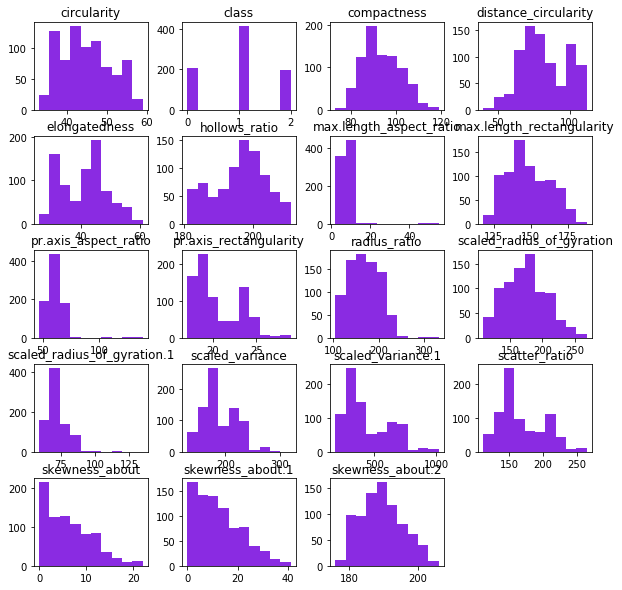

In [21]:
my_data.hist(figsize=(10,10),color="blueviolet",grid=False)
plt.show()

### Here we can see that for attributes 'Circularity','Compactness','Distance_Circularity','max.length_rectangularity','hollows_ratio','scaled_radius_of_gyration''pr.axis_aspect_ratio','radius_ratio','scaled_radius_of_gyration','scaled_variance' and 'scewness_about.2'  the distribution is almost Normal.

### But the distribution of attributes 'scaled_radius_of_gyration.1','pr.axis_rectangularity','scaled_variance.1','skewness_about','skewness_about.1' is positively right skewed.

## 1.12 Print/ Plot the dependent (categorical variable)

In [22]:
#Since the variable is categorical, you can use value_counts function
pd.value_counts(my_data['class'])

1    413
0    205
2    195
Name: class, dtype: int64

Text(0.5, 1.0, 'Class distribution')

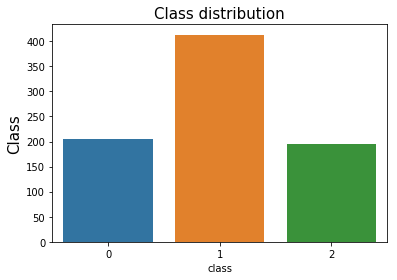

In [23]:
#importing seaborn for statistical plots
import seaborn as sns

sns.countplot(x = 'class', data = my_data, orient = 'v')
plt.ylabel("Class", fontsize=15)
plt.title('Class distribution', fontsize=15)

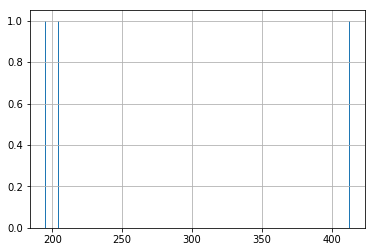

In [24]:
pd.value_counts(my_data['class']).hist(bins=300)

In [25]:
my_data.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

## 1.13 PairPlot 

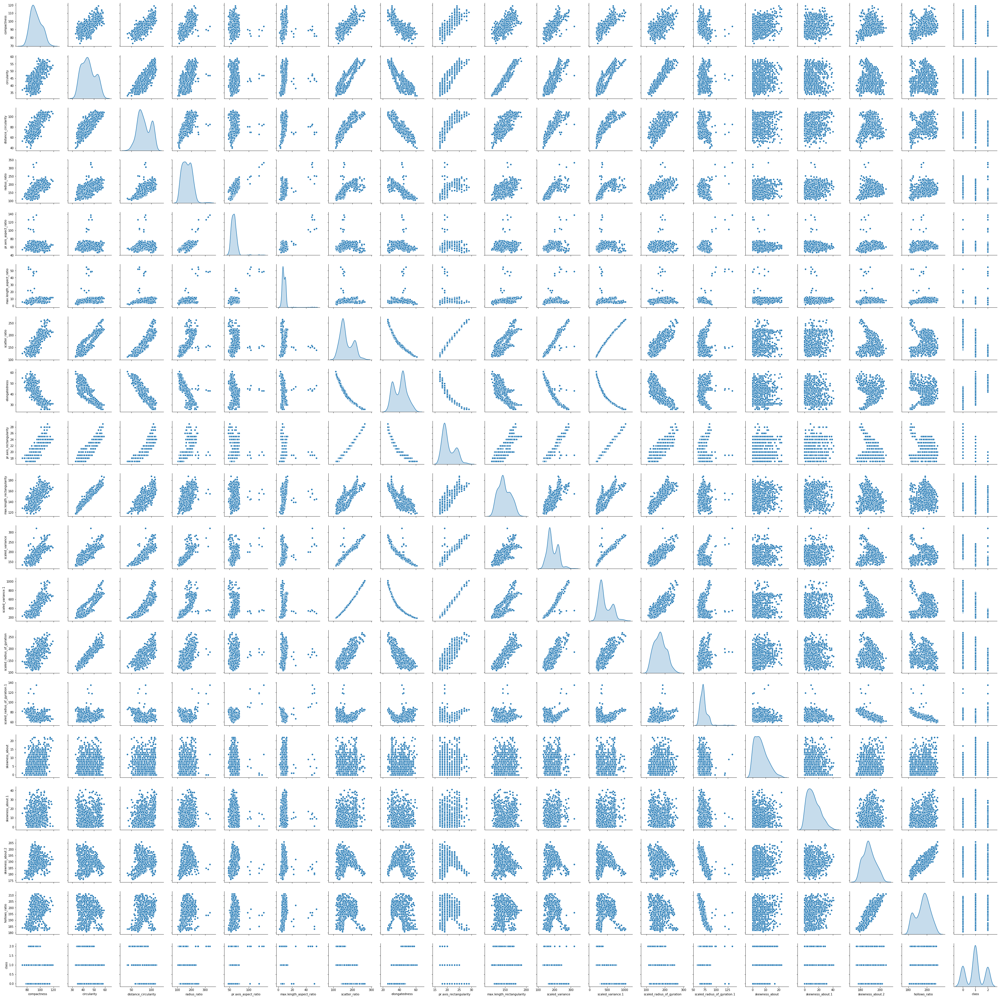

In [26]:
#importing seaborn for statistical plots
sns.pairplot(my_data , diag_kind='kde')

# Observations
### From diagonal plots we can see class has 3 points (evident from data)
### circularity,max.length_rectangularity,scaled_radius_of_gyration --> shows three peaks majorily
### distance_circularity,radius_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance, scaled_variance.1,scaled_variance.2,hollows_ratio  --> shows two peaks 
### compactness,pr.axis_aspect_ratio,max.length_aspect_ratio,scaled_radius_of_gyration.1,skewness_about, skewness_about.1,skewness_about.2 are nearly Normal
### distance_circularity and scatter_ratio and elongatedness shows 2 clusters 

### From bivariate plots we can see that compactness shows negative liner relationship with elongatedness
### elongatedness gives negative liner relationship with almost all th other attributes
### (correlation too gives high negative correlation)


## 1.14 Checking the presence of outliers 

### compactness 

In [27]:
# Quartiles
print('1º Quartile: ', my_data['compactness'].quantile(q = 0.25))
print('2º Quartile: ', my_data['compactness'].quantile(q = 0.50))
print('3º Quartile: ', my_data['compactness'].quantile(q = 0.75))
print('4º Quartile: ', my_data['compactness'].quantile(q = 1.00))

# Interquartile range, IQR = Q3 - Q1
  # lower 1.5*IQR whisker = Q1 - 1.5 * IQR 
  # Upper 1.5*IQR whisker = Q3 + 1.5 * IQR
    
print('compactness above: ', my_data['compactness'].quantile(q = 0.75) + 
                      1.5*(my_data['compactness'].quantile(q = 0.75) - my_data['compactness'].quantile(q = 0.25)), 'are outliers')

1º Quartile:  87.0
2º Quartile:  93.0
3º Quartile:  100.0
4º Quartile:  119.0
compactness above:  119.5 are outliers


In [28]:
print('Numerber of outliers: ', my_data[my_data['compactness'] >  119.5]['compactness'].count())
print('Number of vehicle,: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['compactness'] >  119.5]['compactness'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicle,:  813
Outliers are: 0.0 %


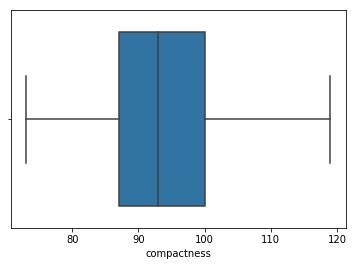

In [29]:
sns.boxplot(x='compactness',hue='class',data=my_data)

Text(0.5, 1.0, 'Distribution of Vehicle Class by compactness and circularity')

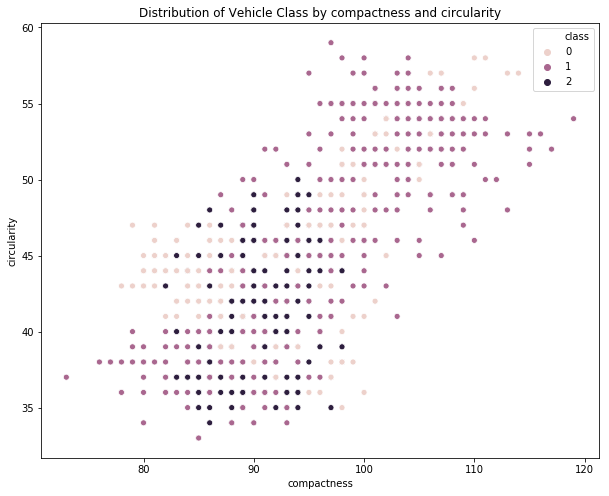

In [30]:
plt.figure(figsize = (10,8))
sns.scatterplot(x = "compactness", y = "circularity",data =my_data, hue = "class")
plt.xlabel("compactness")
plt.ylabel("circularity")
plt.title("Distribution of Vehicle Class by compactness and circularity")

### circularity 

In [31]:
# Quartiles
print('circularity above: ', my_data['circularity'].quantile(q = 0.75) + 
                      1.5*(my_data['circularity'].quantile(q = 0.75) - my_data['circularity'].quantile(q = 0.25)), 'are outliers')

circularity above:  62.5 are outliers


In [32]:
print('Numerber of outliers: ', my_data[my_data['circularity'] >  62.5]['circularity'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['circularity'] >  62.5]['circularity'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


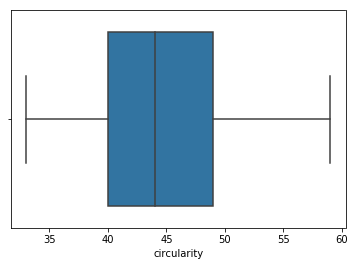

In [33]:
sns.boxplot(x='circularity',hue='class',data=my_data)

### distance_circularity 

In [34]:
# Quartiles
print('distance_circularity above: ', my_data['distance_circularity'].quantile(q = 0.75) + 
                      1.5*(my_data['distance_circularity'].quantile(q = 0.75) - my_data['distance_circularity'].quantile(q = 0.25)), 'are outliers')

distance_circularity above:  140.0 are outliers


In [35]:
print('Numerber of outliers: ', my_data[my_data['distance_circularity'] >  140.0]['distance_circularity'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['distance_circularity'] >  140.0]['distance_circularity'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


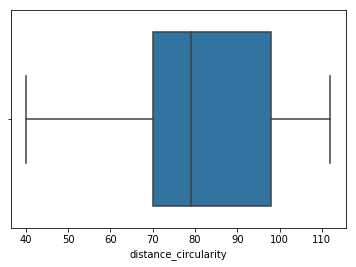

In [36]:
sns.boxplot(x='distance_circularity',hue='class',data=my_data)

### radius_ratio 

In [37]:
# Quartiles
print('radius_ratio above: ', my_data['radius_ratio'].quantile(q = 0.75) + 
                      1.5*(my_data['radius_ratio'].quantile(q = 0.75) - my_data['radius_ratio'].quantile(q = 0.25)), 'are outliers')

radius_ratio above:  276.0 are outliers


In [38]:
print('Numerber of outliers: ', my_data[my_data['radius_ratio'] >  276.0]['radius_ratio'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['radius_ratio'] >  276.0]['radius_ratio'].count()*100/len(my_data),2), '%')

Numerber of outliers:  3
Number of vehicles:  813
Outliers are: 0.37 %


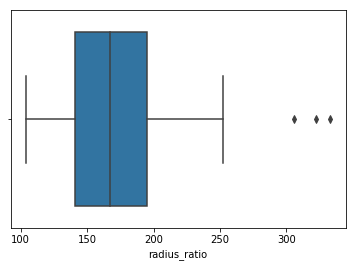

In [39]:
sns.boxplot(x='radius_ratio',hue='class',data=my_data)

### pr.axis_aspect_ratio 

In [40]:
# Quartiles
print('pr.axis_aspect_ratio above: ', my_data['pr.axis_aspect_ratio'].quantile(q = 0.75) + 
                      1.5*(my_data['pr.axis_aspect_ratio'].quantile(q = 0.75) - my_data['pr.axis_aspect_ratio'].quantile(q = 0.25)), 'are outliers')

pr.axis_aspect_ratio above:  77.0 are outliers


In [41]:
print('Numerber of outliers: ', my_data[my_data['pr.axis_aspect_ratio'] >  77.0]['pr.axis_aspect_ratio'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['pr.axis_aspect_ratio'] >  77.0]['pr.axis_aspect_ratio'].count()*100/len(my_data),2), '%')

Numerber of outliers:  8
Number of vehicles:  813
Outliers are: 0.98 %


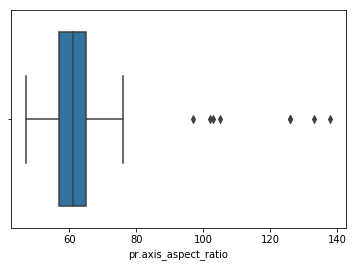

In [42]:
sns.boxplot(x='pr.axis_aspect_ratio',hue='class',data=my_data)

### max.length_aspect_ratio 

In [43]:
# Quartiles
print('max.length_aspect_ratio above: ', my_data['max.length_aspect_ratio'].quantile(q = 0.75) + 
                      1.5*(my_data['max.length_aspect_ratio'].quantile(q = 0.75) - my_data['max.length_aspect_ratio'].quantile(q = 0.25)), 'are outliers')

max.length_aspect_ratio above:  14.5 are outliers


In [44]:
print('Numerber of outliers: ', my_data[my_data['max.length_aspect_ratio'] >  14.5]['max.length_aspect_ratio'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['max.length_aspect_ratio'] >  14.5]['max.length_aspect_ratio'].count()*100/len(my_data),2), '%')

Numerber of outliers:  12
Number of vehicles:  813
Outliers are: 1.48 %


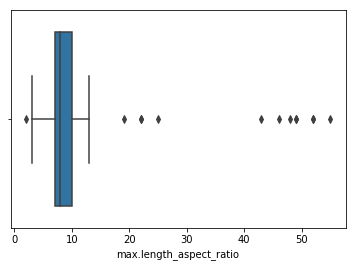

In [45]:
sns.boxplot(x='max.length_aspect_ratio',hue='class',data=my_data)

### scatter_ratio 

In [46]:
# Quartiles
print('scatter_ratio above: ', my_data['scatter_ratio'].quantile(q = 0.75) + 
                      1.5*(my_data['scatter_ratio'].quantile(q = 0.75) - my_data['scatter_ratio'].quantile(q = 0.25)), 'are outliers')

scatter_ratio above:  276.0 are outliers


In [47]:
print('Numerber of outliers: ', my_data[my_data['scatter_ratio'] >  276.0]['scatter_ratio'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['scatter_ratio'] >  276.0]['scatter_ratio'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


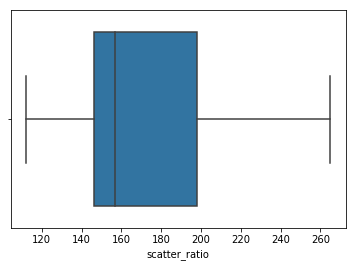

In [48]:
sns.boxplot(x='scatter_ratio',hue='class',data=my_data)

### elongatedness 

In [49]:
# Quartiles
print('elongatedness above: ', my_data['elongatedness'].quantile(q = 0.75) + 
                      1.5*(my_data['elongatedness'].quantile(q = 0.75) - my_data['elongatedness'].quantile(q = 0.25)), 'are outliers')

elongatedness above:  65.5 are outliers


In [50]:
print('Numerber of outliers: ', my_data[my_data['elongatedness'] >  65.5]['elongatedness'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['elongatedness'] >  65.5]['elongatedness'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


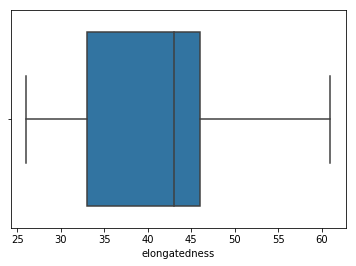

In [51]:
sns.boxplot(x='elongatedness',hue='class',data=my_data)

### pr.axis_rectangularity 

In [52]:
# Quartiles
print('pr.axis_rectangularity above: ', my_data['pr.axis_rectangularity'].quantile(q = 0.75) + 
                      1.5*(my_data['pr.axis_rectangularity'].quantile(q = 0.75) - my_data['pr.axis_rectangularity'].quantile(q = 0.25)), 'are outliers')

pr.axis_rectangularity above:  29.0 are outliers


In [53]:
print('Numerber of outliers: ', my_data[my_data['pr.axis_rectangularity'] >  29.0]['pr.axis_rectangularity'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['pr.axis_rectangularity'] >  29.0]['pr.axis_rectangularity'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


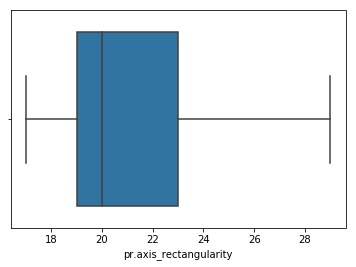

In [54]:
sns.boxplot(x='pr.axis_rectangularity',hue='class',data=my_data)

### max.length_rectangularity 

In [55]:
# Quartiles
print('max.length_rectangularity above: ', my_data['max.length_rectangularity'].quantile(q = 0.75) + 
                      1.5*(my_data['max.length_rectangularity'].quantile(q = 0.75) - my_data['max.length_rectangularity'].quantile(q = 0.25)), 'are outliers')

max.length_rectangularity above:  192.0 are outliers


In [56]:

print('Numerber of outliers: ', my_data[my_data['max.length_rectangularity'] >  192.0]['max.length_rectangularity'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['max.length_rectangularity'] >  192.0]['max.length_rectangularity'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


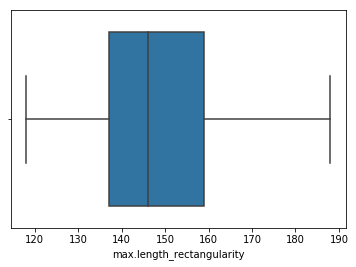

In [57]:
sns.boxplot(x='max.length_rectangularity',hue='class',data=my_data)

### scaled_variance 

In [58]:
# Quartiles
print('scaled_variance above: ', my_data['scaled_variance'].quantile(q = 0.75) + 
                      1.5*(my_data['scaled_variance'].quantile(q = 0.75) - my_data['scaled_variance'].quantile(q = 0.25)), 'are outliers')

scaled_variance above:  292.0 are outliers


In [59]:
print('Numerber of outliers: ', my_data[my_data['scaled_variance'] >  292.0]['scaled_variance'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['scaled_variance'] >  292.0]['scaled_variance'].count()*100/len(my_data),2), '%')

Numerber of outliers:  1
Number of vehicles:  813
Outliers are: 0.12 %


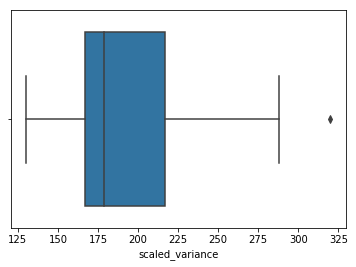

In [60]:
sns.boxplot(x='scaled_variance',hue='class',data=my_data)

### scaled_variance.1 

In [61]:
# Quartiles
print('scaled_variance.1 above: ', my_data['scaled_variance.1'].quantile(q = 0.75) + 
                      1.5*(my_data['scaled_variance.1'].quantile(q = 0.75) - my_data['scaled_variance.1'].quantile(q = 0.25)), 'are outliers')

scaled_variance.1 above:  988.0 are outliers


In [62]:
print('Numerber of outliers: ', my_data[my_data['scaled_variance.1'] >  988.0]['scaled_variance.1'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['scaled_variance.1'] >  988.0]['scaled_variance.1'].count()*100/len(my_data),2), '%')

Numerber of outliers:  2
Number of vehicles:  813
Outliers are: 0.25 %


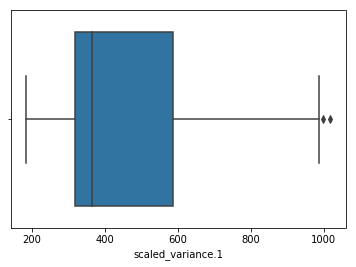

In [63]:
sns.boxplot(x='scaled_variance.1',hue='class',data=my_data)

### scaled_radius_of_gyration 

In [64]:
# Quartiles
print('scaled_radius_of_gyration above: ', my_data['scaled_radius_of_gyration'].quantile(q = 0.75) + 
                      1.5*(my_data['scaled_radius_of_gyration'].quantile(q = 0.75) - my_data['scaled_radius_of_gyration'].quantile(q = 0.25)), 'are outliers')

scaled_radius_of_gyration above:  271.5 are outliers


In [65]:
print('Numerber of outliers: ', my_data[my_data['scaled_radius_of_gyration'] >  271.5]['scaled_radius_of_gyration'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['scaled_radius_of_gyration'] >  271.5]['scaled_radius_of_gyration'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


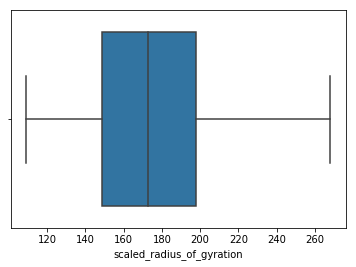

In [66]:
sns.boxplot(x='scaled_radius_of_gyration',hue='class',data=my_data)

### scaled_radius_of_gyration.1 

In [67]:

# Quartiles
print('scaled_radius_of_gyration.1 above: ', my_data['scaled_radius_of_gyration.1'].quantile(q = 0.75) + 
                      1.5*(my_data['scaled_radius_of_gyration.1'].quantile(q = 0.75) - my_data['scaled_radius_of_gyration.1'].quantile(q = 0.25)), 'are outliers')

scaled_radius_of_gyration.1 above:  87.0 are outliers


In [68]:
print('Numerber of outliers: ', my_data[my_data['scaled_radius_of_gyration.1'] >  87.0]['scaled_radius_of_gyration.1'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['scaled_radius_of_gyration.1'] >  87.0]['scaled_radius_of_gyration.1'].count()*100/len(my_data),2), '%')

Numerber of outliers:  15
Number of vehicles:  813
Outliers are: 1.85 %


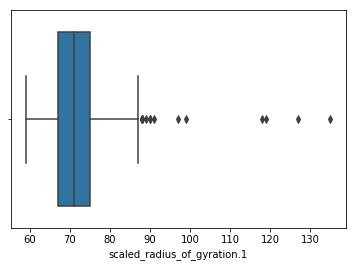

In [69]:
sns.boxplot(x='scaled_radius_of_gyration.1',hue='class',data=my_data)

### skewness_about 

In [70]:
# Quartiles
print('skewness_about above: ', my_data['skewness_about'].quantile(q = 0.75) + 
                      1.5*(my_data['skewness_about'].quantile(q = 0.75) - my_data['skewness_about'].quantile(q = 0.25)), 'are outliers')

skewness_about above:  19.5 are outliers


In [71]:
print('Numerber of outliers: ', my_data[my_data['skewness_about'] >  19.5]['skewness_about'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['skewness_about'] >  19.5]['skewness_about'].count()*100/len(my_data),2), '%')

Numerber of outliers:  12
Number of vehicles:  813
Outliers are: 1.48 %


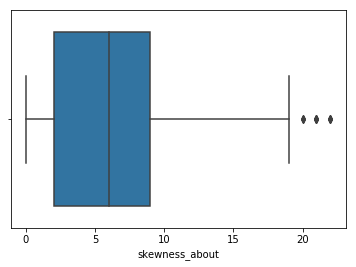

In [72]:
sns.boxplot(x='skewness_about',hue='class',data=my_data)

### skewness_about.1 

In [73]:
# Quartiles
print('skewness_about.1 above: ', my_data['skewness_about.1'].quantile(q = 0.75) + 
                      1.5*(my_data['skewness_about.1'].quantile(q = 0.75) - my_data['skewness_about.1'].quantile(q = 0.25)), 'are outliers')

skewness_about.1 above:  38.5 are outliers


In [74]:
print('Numerber of outliers: ', my_data[my_data['skewness_about.1'] >  38.5]['skewness_about.1'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['skewness_about.1'] >  38.5]['skewness_about.1'].count()*100/len(my_data),2), '%')

Numerber of outliers:  3
Number of vehicles:  813
Outliers are: 0.37 %


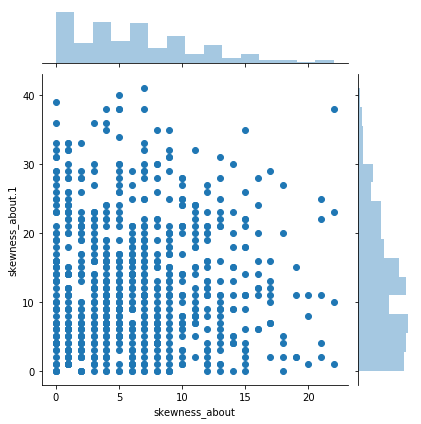

In [75]:
sns.jointplot(my_data['skewness_about'], my_data['skewness_about.1'])

### skewness_about.2 

In [76]:
# Quartiles
print('skewness_about.2 above: ', my_data['skewness_about.2'].quantile(q = 0.75) + 
                      1.5*(my_data['skewness_about.2'].quantile(q = 0.75) - my_data['skewness_about.2'].quantile(q = 0.25)), 'are outliers')

skewness_about.2 above:  206.5 are outliers


In [77]:
print('Numerber of outliers: ', my_data[my_data['skewness_about.2'] >  206.5]['skewness_about.2'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['skewness_about.2'] >  206.5]['skewness_about.2'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


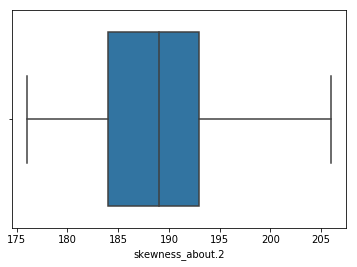

In [78]:
sns.boxplot(x='skewness_about.2',hue='class',data=my_data)

### hollows_ratio 

In [79]:
# Quartiles
print('hollows_ratio above: ', my_data['hollows_ratio'].quantile(q = 0.75) + 
                      1.5*(my_data['hollows_ratio'].quantile(q = 0.75) - my_data['hollows_ratio'].quantile(q = 0.25)), 'are outliers')

hollows_ratio above:  216.0 are outliers


In [80]:
print('Numerber of outliers: ', my_data[my_data['hollows_ratio'] >  216.0]['hollows_ratio'].count())
print('Number of vehicles: ', len(my_data))
#Outliers in %
print('Outliers are:', round(my_data[my_data['hollows_ratio'] >  216.0]['hollows_ratio'].count()*100/len(my_data),2), '%')

Numerber of outliers:  0
Number of vehicles:  813
Outliers are: 0.0 %


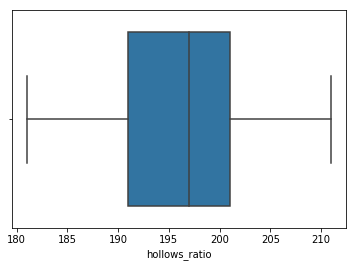

In [81]:
sns.boxplot(x='hollows_ratio',hue='class',data=my_data)

Text(0.5, 1.0, 'Distribution of Vehicle Class by hollows_ratio and skewness_about.2')

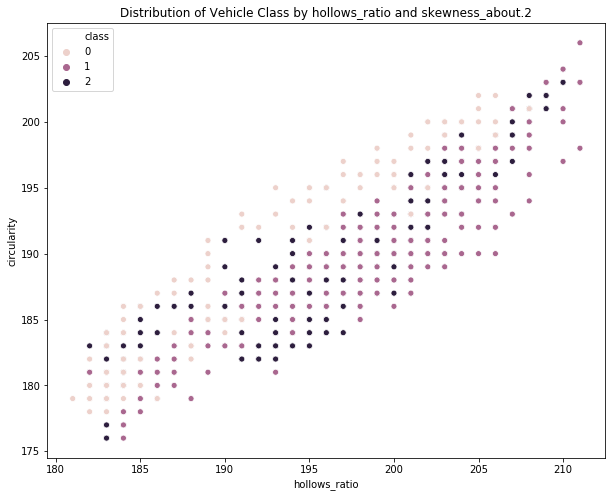

In [82]:
plt.figure(figsize = (10,8))
sns.scatterplot(x = "hollows_ratio", y = "skewness_about.2",data =my_data, hue = "class")
plt.xlabel("hollows_ratio")
plt.ylabel("circularity")
plt.title("Distribution of Vehicle Class by hollows_ratio and skewness_about.2")

## The number of outliers present are
### radius_ratio =3
### pr.axis_aspect_ratio =8
### max.length_aspect_ratio =12
### scaled_variance =1
### scaled_variance.1 =2
### scaled_radius_of_gyration.1 =15
### skewness_about =12
### skewness_about.1 =3

### This counts are not that much.Also there are no outliers present for other attributes. 
### we can use all this attributes for our analysis as there will be no big impact on our model.

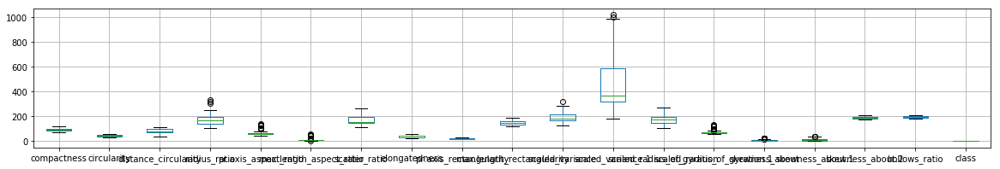

In [83]:
my_data.boxplot(figsize=(20,3))

In [84]:
my_data1=my_data.drop(['max.length_aspect_ratio','scaled_variance.1','scaled_radius_of_gyration.1','skewness_about','skewness_about.1'], axis =1)
my_data1.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_radius_of_gyration,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,162.0,42.0,20.0,159,176.0,184.0,187.0,197,2
1,91,41.0,84.0,141.0,57.0,149.0,45.0,19.0,143,170.0,158.0,189.0,199,2
2,104,50.0,106.0,209.0,66.0,207.0,32.0,23.0,158,223.0,220.0,188.0,196,1
3,93,41.0,82.0,159.0,63.0,144.0,46.0,19.0,143,160.0,127.0,199.0,207,2
4,85,44.0,70.0,205.0,103.0,149.0,45.0,19.0,144,241.0,188.0,180.0,183,0


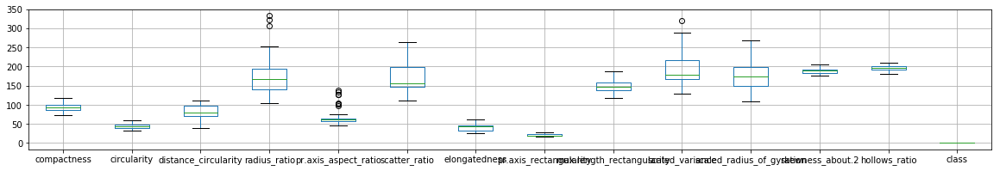

In [85]:
my_data1.boxplot(figsize=(20,3))

In [86]:
#Let us look at the target column which is "class".
my_data.groupby(["class"]).count()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
0,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205
1,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413
2,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001AA343B8358>,
      dtype=object)

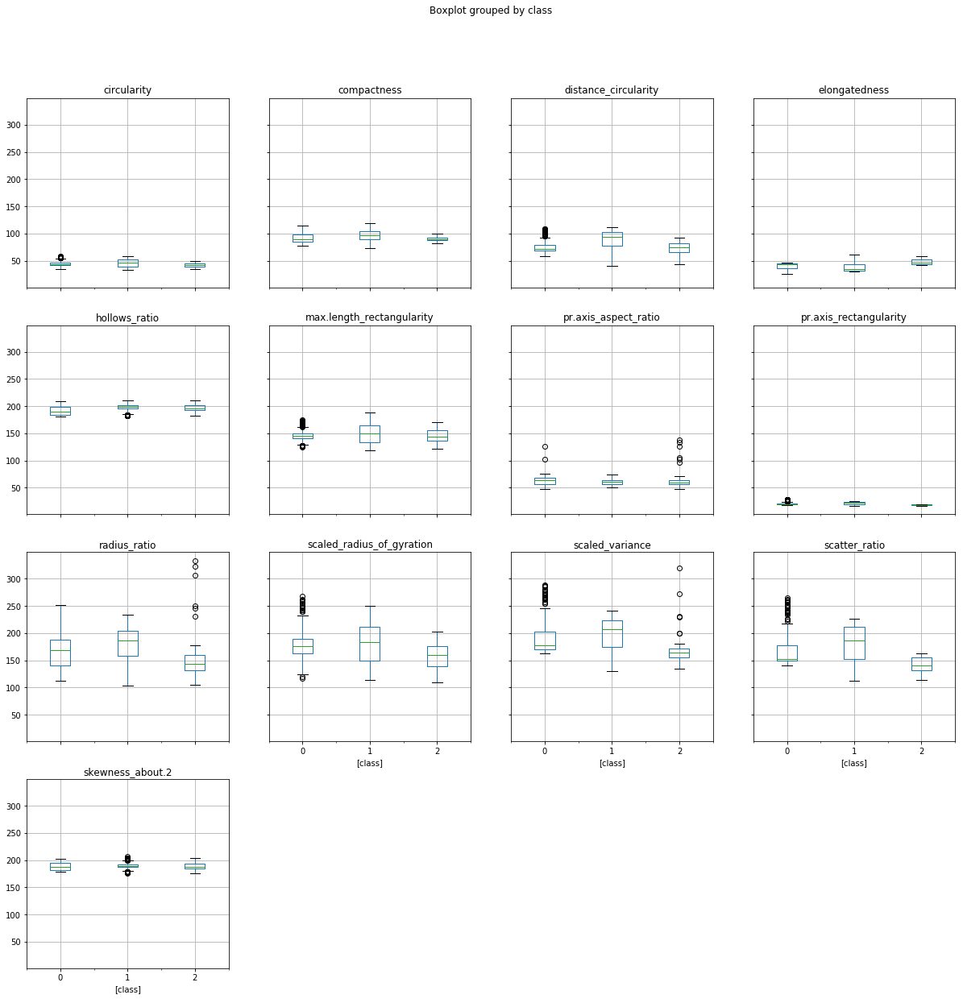

In [87]:
my_data1.boxplot(by = 'class',  layout=(4,4), figsize=(20, 20))

# 2. Understanding the attributes - Find relationships between different attributes (Independent variables) and choose carefully which all attributes have to be a part of the analysis and why 

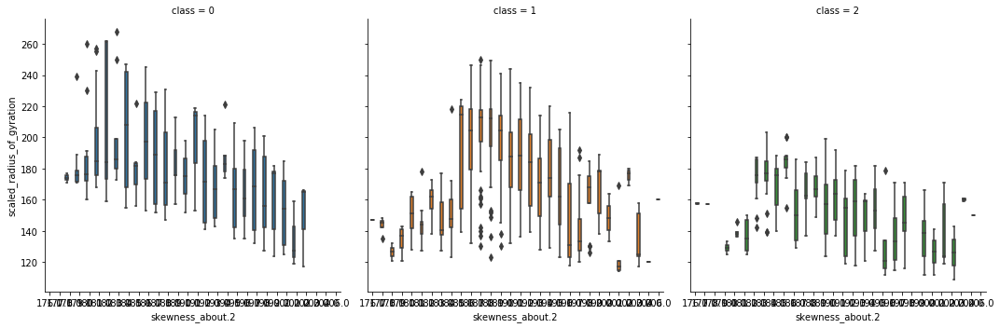

In [88]:
sns.catplot(x="skewness_about.2",y="scaled_radius_of_gyration", col="class", hue="class", data=my_data, kind="box")
plt.show()

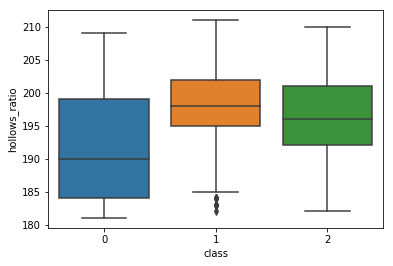

In [89]:
sns.boxplot(x="class",y="hollows_ratio", data=my_data)

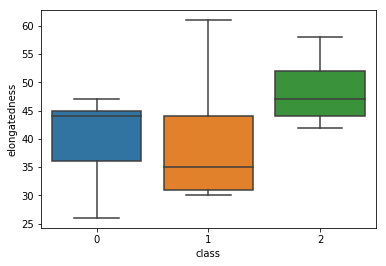

In [90]:
sns.boxplot(x="class",y="elongatedness", data=my_data)

## 2.1 Calculate the correlation matrix 

In [91]:
cor=my_data.corr()
cor

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
compactness,1.000000,0.689885,0.789955,0.688130,0.090557,0.150369,0.814026,-0.788051,0.814227,0.674902,0.764386,0.820240,0.581405,-0.258437,0.231648,0.168384,0.296195,0.372806,-0.037391
circularity,0.689885,1.000000,0.797704,0.623950,0.155023,0.251619,0.858149,-0.825108,0.856137,0.965366,0.806108,0.850932,0.935594,0.049070,0.141726,-0.001975,-0.113902,0.049331,-0.161018
distance_circularity,0.789955,0.797704,1.000000,0.771404,0.163386,0.265591,0.909023,-0.912713,0.897261,0.773459,0.865683,0.891789,0.705689,-0.238145,0.110280,0.277851,0.145258,0.343228,-0.067445
radius_ratio,0.688130,0.623950,0.771404,1.000000,0.667375,0.452460,0.743470,-0.795761,0.716210,0.570478,0.806788,0.731773,0.544636,-0.175348,0.044693,0.178079,0.375591,0.470895,-0.199219
pr.axis_aspect_ratio,0.090557,0.155023,0.163386,0.667375,1.000000,0.652093,0.113696,-0.191193,0.086992,0.133553,0.290375,0.100668,0.135663,0.173060,-0.059244,-0.040769,0.229702,0.257566,-0.114292
max.length_aspect_ratio,0.150369,0.251619,0.265591,0.452460,0.652093,1.000000,0.171445,-0.183242,0.167514,0.309180,0.331124,0.150069,0.197179,0.308329,0.016461,0.041210,-0.030543,0.139283,0.202235
scatter_ratio,0.814026,0.858149,0.909023,0.743470,0.113696,0.171445,1.000000,-0.973413,0.991992,0.808154,0.950067,0.996396,0.795748,-0.045632,0.070118,0.227375,0.009967,0.138424,-0.287590
elongatedness,-0.788051,-0.825108,-0.912713,-0.795761,-0.191193,-0.183242,-0.973413,1.000000,-0.950345,-0.771099,-0.937846,-0.956858,-0.761563,0.119750,-0.046621,-0.201325,-0.117568,-0.233408,0.342712
pr.axis_rectangularity,0.814227,0.856137,0.897261,0.716210,0.086992,0.167514,0.991992,-0.950345,1.000000,0.811979,0.935653,0.992119,0.792895,-0.033769,0.078701,0.231171,-0.017383,0.117202,-0.255354
max.length_rectangularity,0.674902,0.965366,0.773459,0.570478,0.133553,0.309180,0.808154,-0.771099,0.811979,1.000000,0.744760,0.796230,0.865240,0.031098,0.130356,0.013045,-0.108019,0.086792,-0.025539


## 2.2 Heatmap 

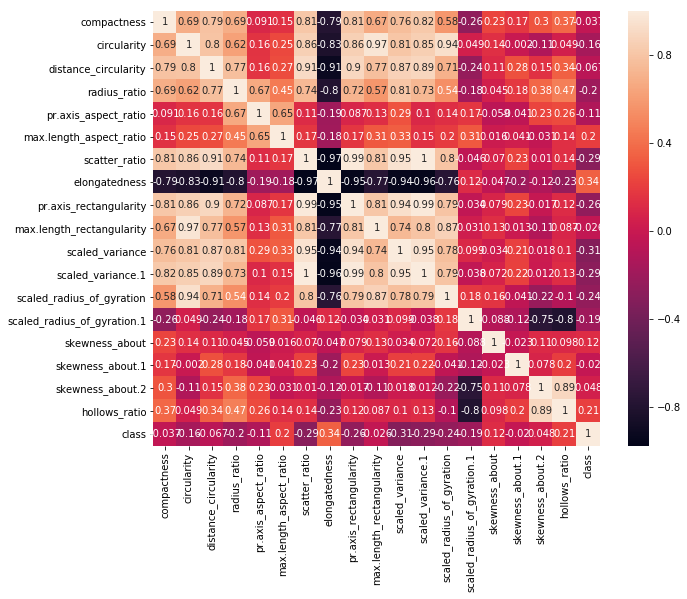

In [92]:
plt.subplots(figsize=(10,8))
sns.heatmap(cor,annot=True)

# Conclusion:

## 1. Here we can see that there is some realtion between each independent attribute with another , which we can see in scatterplot.
## 2. We can use all the attributes as a part of analysis and to build a model to check accuracy.
## 3.There is negative corelation between Compactness and elongatedness attributes.

## 4.Here we can see that for attributes  'Circularity','Compactness','Distance_Circularity','max.length_rectangularity', 'hollows_ratio','scaled_radius_of_gyration''pr.axis_aspect_ratio','radius_ratio', 'scaled_radius_of_gyration','scaled_variance' and 'scewness_about.2'  the distribution is almost Normal.

## 5.But the distribution of attributes 'scaled_radius_of_gyration.1','pr.axis_rectangularity','scaled_variance.1','skewness_about', 'skewness_about.1' is positively right skewed.

### a. Attribute Circularity and scaled_radius_of_gyration are somehow dependent on each other.
### b. Elongatedness of class2(van) is high as compared to other classes.But the class1(car) has big range (between 30-45) as compared to other classes.
### c. There is big range of Hollows_ratio for class0(bus) which is from 182 to 200.
### d. Radius ratio and also Scatter ratio of class1 is higher than other classes which is obvious.
### e. We can consider skewness_about.2 instead of skewness_about and skewness_about.1 for better analysis.
### f.Range of Circularity for class0 is very low as compared to other.
### g. The number of outliers present are
1.radius_ratio =3

2.pr.axis_aspect_ratio =8

3.max.length_aspect_ratio =12

4.scaled_variance =1

5.scaled_variance.1 =2

6.scaled_radius_of_gyration.1 =15

7.skewness_about =12

8.skewness_about.1 =3

## This counts are not that much.Also there are no outliers present for other attributes. 
## 6.We can use all this attributes for our analysis as there will be no big impact on our model.


# Observations/Relations between independent attributes:
### 1.From diagonal plots we can see class has 3 points (evident from data)
### 2.circularity,max.length_rectangularity,scaled_radius_of_gyration --> shows three peaks majorily
###  3.distance_circularity,radius_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance, scaled_variance.1,scaled_variance.2,hollows_ratio  --> shows two peaks 
### 4.compactness,pr.axis_aspect_ratio,max.length_aspect_ratio,scaled_radius_of_gyration.1,skewness_about, skewness_about.1,skewness_about.2 are nearly Normal
### 5.distance_circularity and scatter_ratio and elongatedness shows 2 clusters 

### 6.From bivariate plots we can see that compactness shows negative liner relationship with elongatedness
### 7.elongatedness gives negative liner relationship with almost all th other attributes
### (correlation too gives high negative correlation)


# 3. Use PCA from scikit learn and elbow plot to find out reduced number of dimension (which covers more than 95% of the variance)

## 3.1 K-Means Clustering 

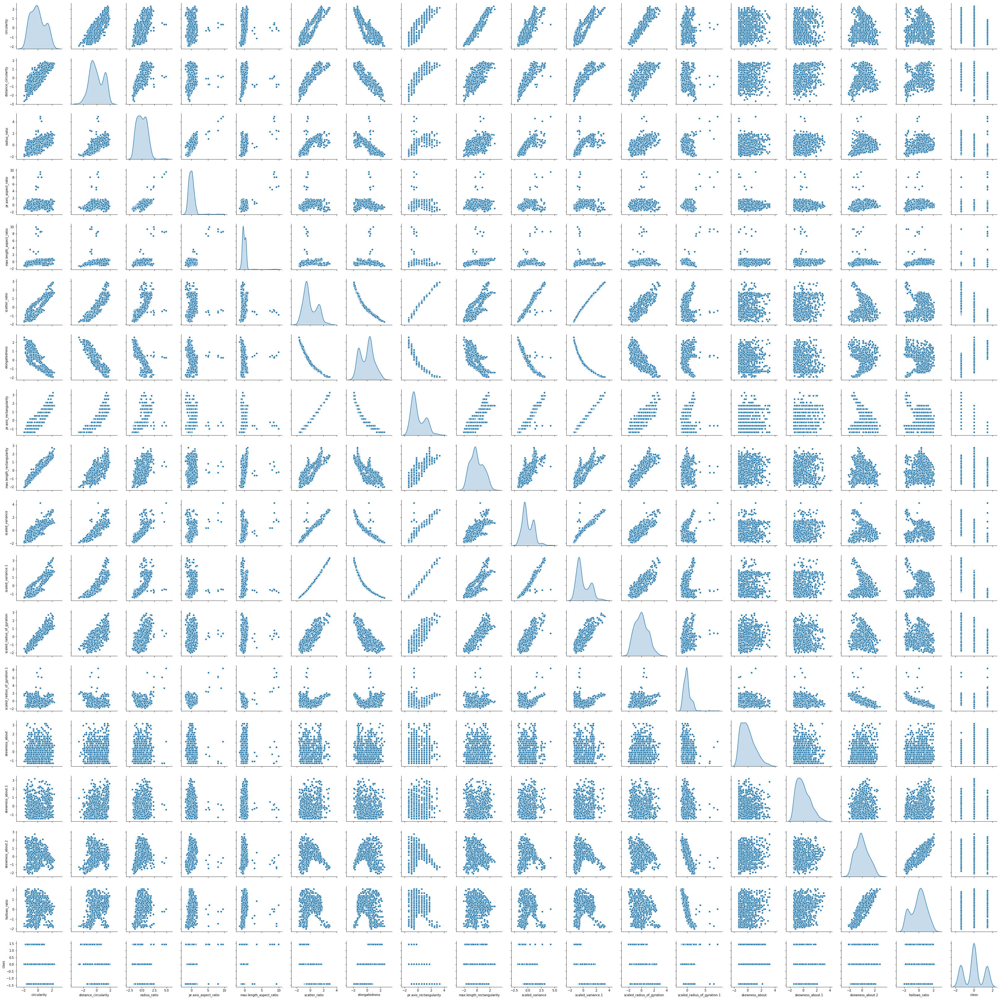

In [93]:
from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans

from scipy.stats import zscore

my_data1=my_data.iloc[:,1:]
my_dataScaled=my_data1.apply(zscore)
sns.pairplot(my_dataScaled,diag_kind='kde')

## 3.2 elbow plot to find out reduced number of dimension

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

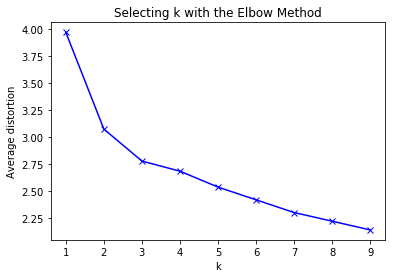

In [94]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(my_dataScaled)
    prediction=model.predict(my_dataScaled)
    meanDistortions.append(sum(np.min(cdist(my_dataScaled, model.cluster_centers_, 'euclidean'), axis=1)) / my_dataScaled.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


## We could see the bend at 3.Looks like the best value ("elbow" of the line) for k is 3 (three clusters). 

In [95]:
# Let us first start with K = 3
final_model=KMeans(3)
final_model.fit(my_dataScaled)
prediction=final_model.predict(my_dataScaled)

#Append the prediction 
my_data["GROUP"] = prediction
my_dataScaled["GROUP"] = prediction
print("Groups Assigned : \n")
my_data.head()

Groups Assigned : 



,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class,GROUP
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2,2
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2,2
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,1,1
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2,2
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,0,0


In [96]:
my_dataClust = my_data.groupby(['GROUP'])
my_dataClust.mean()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
GROUP,,,,,,,,,,,,,,,,,,,
0,86.447059,41.819608,68.796078,134.360784,57.764706,7.490196,143.572549,47.474510,18.694118,141.470588,164.564706,304.627451,162.549020,78.109804,5.917647,9.988235,182.721569,187.913725,1.054902
1,102.676806,51.931559,100.596958,203.498099,63.790875,10.315589,210.121673,31.790875,23.802281,163.524715,226.258555,660.228137,209.110266,72.387833,7.038023,14.866920,188.908745,196.988593,0.836502
2,91.847458,41.027119,76.952542,168.457627,63.444068,8.027119,153.115254,43.583051,19.277966,139.505085,175.189831,356.220339,153.291525,67.474576,6.115254,13.077966,194.450847,201.362712,1.064407


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001AA430F1240>,
      dtype=object)

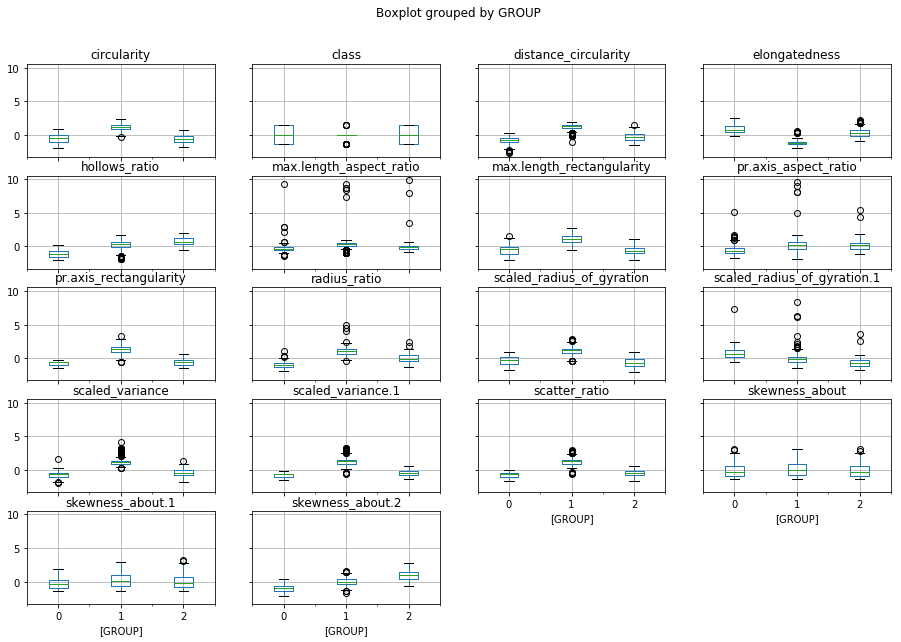

In [97]:
my_dataScaled.boxplot(by='GROUP',figsize=(15,10))

### 3 clusters gives a clear separation of high and low values .

### Group 0 is characterised by lower scaled_variance.1,higher skewness_about.2
### Group 1 -High circularity,low elongatedness,high radius_ratio,high pr.axis_rectangularity,high circularity
### Group 2 - Low scaled_variance.1,low scatter_ratio,low,skewness_about.2,high scaled_radius_of_gyration.1

In [98]:
# Let us first start with K = 5
final_model=KMeans(5)
final_model.fit(my_dataScaled)
prediction=final_model.predict(my_dataScaled)

#Append the prediction 
my_data["GROUP"] = prediction
my_dataScaled["GROUP"] = prediction
print("Groups Assigned : \n")
my_data.head()

Groups Assigned : 



,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class,GROUP
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2,0
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2,1
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,1,3
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2,1
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,0,4


In [99]:
my_dataClust = my_data.groupby(['GROUP'])
my_dataClust.mean()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
GROUP,,,,,,,,,,,,,,,,,,,
0,93.646739,42.641304,81.065217,182.559783,65.070652,7.483696,166.347826,39.625000,20.206522,141.771739,188.451087,420.625000,162.402174,68.532609,5.744565,13.211957,193.967391,200.168478,0.576087
1,90.350746,39.753731,73.455224,152.783582,60.850746,8.074627,140.261194,47.679104,18.395522,138.126866,161.455224,295.216418,145.179104,65.955224,6.701493,12.932836,194.947761,202.462687,1.656716
2,86.392857,41.849206,68.849206,134.115079,57.599206,7.321429,143.694444,47.436508,18.702381,141.531746,164.388889,305.111111,162.726190,77.992063,5.853175,9.924603,182.670635,187.880952,1.055556
3,103.544681,52.527660,102.000000,202.004255,62.344681,9.757447,213.706383,31.204255,24.106383,164.931915,227.595745,680.340426,212.234043,71.842553,7.208511,15.170213,188.582979,196.944681,0.838298
4,87.625000,45.250000,77.750000,268.125000,116.250000,49.250000,150.875000,44.625000,19.125000,152.000000,241.250000,335.375000,181.125000,109.500000,5.000000,10.625000,184.625000,192.375000,1.500000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001AA475C0400>,
      dtype=object)

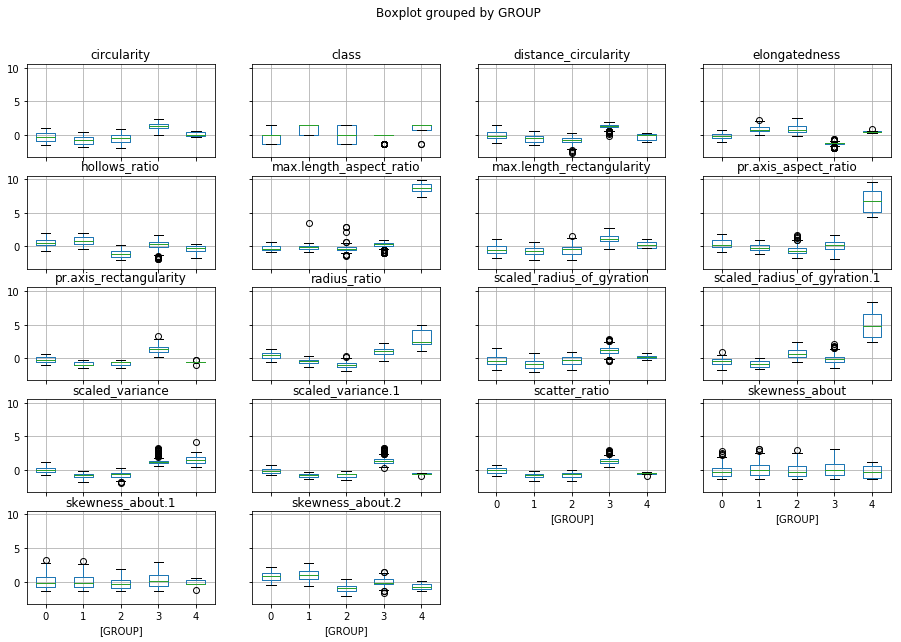

In [100]:
my_dataScaled.boxplot(by='GROUP',figsize=(15,10))

## 3.3 PCA from scikit learn to find out reduced number of dimension (which covers more than 95% of the variance)

In [101]:
from sklearn.decomposition import PCA

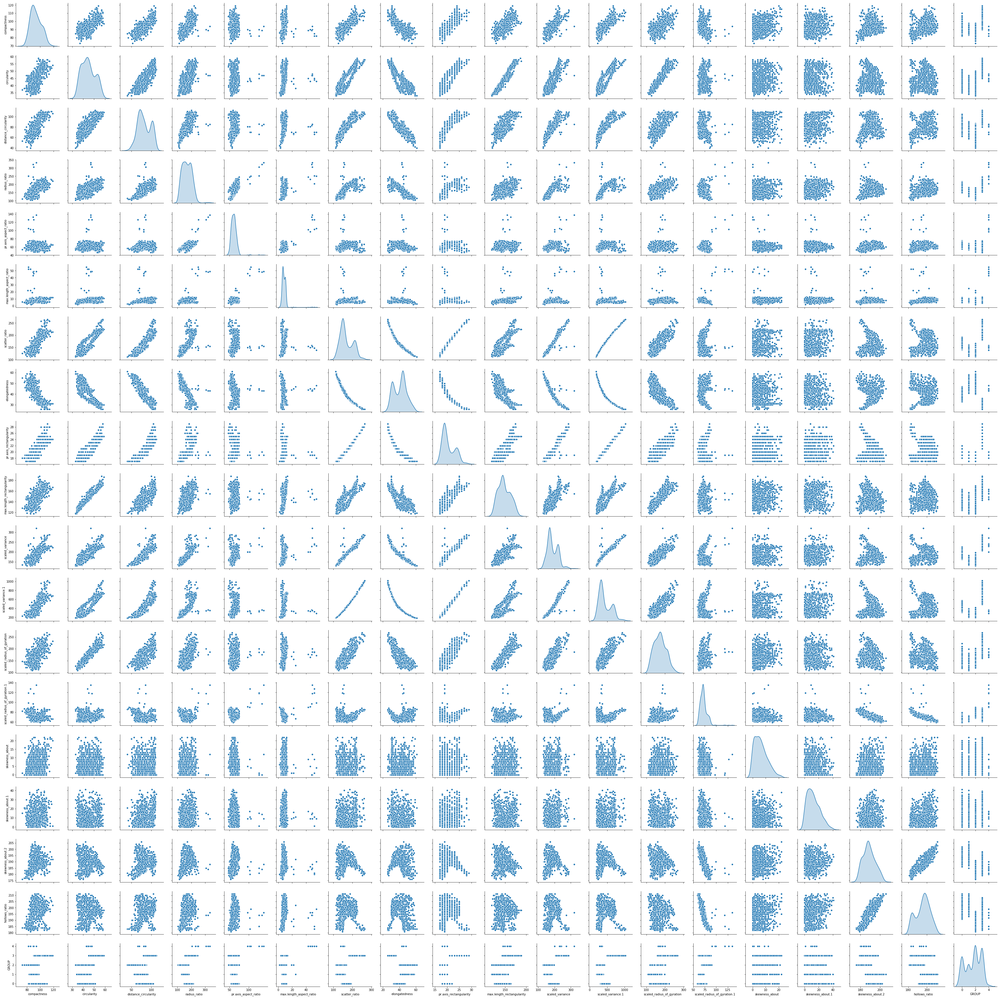

In [102]:
# independant variables
#X = my_data.drop(['class','max.length_aspect_ratio','scaled_variance.1','scaled_radius_of_gyration.1','skewness_about','skewness_about.1'], axis=1)
X = my_data.drop(['class'], axis=1)
# the dependent variable
y = my_data[['class']]

sns.pairplot(X, diag_kind='kde')   # to plot density curve instead of histogram on the diag

In [103]:
from scipy.stats import zscore
XScaled=X.apply(zscore)
XScaled.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,GROUP
0,0.163231,0.520408,0.060669,0.264970,1.283254,0.299721,-0.198517,0.129648,-0.217151,0.766312,-0.397397,-0.339014,0.301676,-0.321192,-0.071523,0.371287,-0.321809,0.171837,-1.481512
1,-0.322874,-0.619123,0.124067,-0.836393,-0.599253,0.085785,-0.591720,0.514333,-0.606014,-0.337462,-0.590034,-0.618754,-0.502972,-0.053505,0.538425,0.147109,0.003400,0.442318,-0.605535
2,1.256966,0.845988,1.518823,1.187734,0.530251,0.299721,1.162569,-1.152637,0.949438,0.697326,1.111591,1.122486,1.415804,0.080339,1.555006,-0.413338,-0.159204,0.036596,1.146421
3,-0.079822,-0.619123,-0.002729,-0.300595,0.153750,0.085785,-0.742952,0.642562,-0.606014,-0.337462,-0.911095,-0.738643,-1.462359,-1.258099,-0.071523,-0.301249,1.629444,1.524243,-0.605535
4,-1.052030,-0.130753,-0.763506,1.068668,5.173770,9.285029,-0.591720,0.514333,-0.606014,-0.268476,1.689501,-0.647299,0.425468,7.307905,0.538425,-0.189159,-1.460039,-1.721531,2.022399


In [104]:
covMatrix = np.cov(XScaled,rowvar=False)
print(covMatrix)

[[ 1.00123153  0.69073497  0.79092746  0.68897729  0.09066804  0.1505537
   0.81502868 -0.78902127  0.81522961  0.67573322  0.76532752  0.82125027
   0.58212123 -0.25875528  0.23193313  0.16859183  0.29656022  0.3732647
   0.35054672]
 [ 0.69073497  1.00123153  0.79868656  0.62471862  0.15521415  0.25192897
   0.85920548 -0.8261242   0.85719089  0.96655501  0.80710097  0.85197956
   0.93674669  0.0491303   0.1419004  -0.00197723 -0.1140426   0.04939203
   0.57858651]
 [ 0.79092746  0.79868656  1.00123153  0.77235395  0.16358689  0.26591783
   0.91014241 -0.9138366   0.89836576  0.77441118  0.86674929  0.89288735
   0.70655787 -0.23843852  0.11041593  0.278193    0.14543699  0.34365085
   0.4193738 ]
 [ 0.68897729  0.62471862  0.77235395  1.00123153  0.66819724  0.45301698
   0.74438595 -0.79674104  0.71709175  0.57118076  0.80778118  0.73267385
   0.54530637 -0.17556405  0.04474816  0.17829807  0.37605357  0.47147529
   0.2103233 ]
 [ 0.09066804  0.15521415  0.16358689  0.66819724  1.0

In [105]:
pca = PCA(n_components=6)
pca.fit(XScaled)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [106]:
print(pca.explained_variance_)

[9.70995044 3.29752977 1.91822342 1.17177385 0.95923171 0.62293012]


In [107]:
print(pca.components_)

[[ 0.26849996  0.29308589  0.29879564  0.26031651  0.07875849  0.10057391
   0.31255029 -0.30661666  0.31020467  0.28064292  0.30520392  0.31034483
   0.27087307 -0.01408497  0.03920698  0.06050164  0.01720291  0.06647567
   0.17032768]
 [-0.13524147  0.10628152 -0.08822882 -0.19006334 -0.10235996  0.04090798
   0.0140649   0.04848106  0.02870923  0.09680426  0.0297235   0.01871278
   0.17574293  0.46791435 -0.04567121 -0.11212327 -0.52098595 -0.51039693
   0.32242688]
 [-0.11417538 -0.03900468 -0.05477785  0.28277388  0.64594229  0.58719932
  -0.1005053   0.05840015 -0.11389055 -0.02613633  0.05728651 -0.11132076
  -0.04096886  0.26873077 -0.10792004 -0.07813579  0.03871057  0.06459644
   0.016689  ]
 [ 0.08480256  0.18443532 -0.06703463 -0.04706681  0.02519436  0.03916329
  -0.09915963  0.09262315 -0.09545698  0.18910081 -0.12589102 -0.09580102
   0.1955307  -0.08178988  0.62041065 -0.64303938  0.10921239  0.06477144
   0.04638903]
 [ 0.08072328 -0.10028771  0.04987312 -0.05533801 -0

In [108]:
print(pca.explained_variance_ratio_)

[0.51042143 0.17334072 0.10083495 0.06159645 0.05042378 0.03274547]


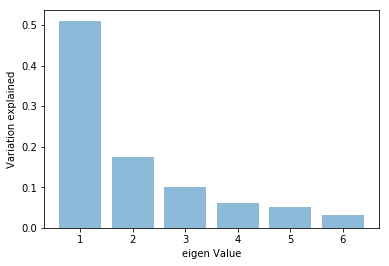

In [109]:
plt.bar(list(range(1,7)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

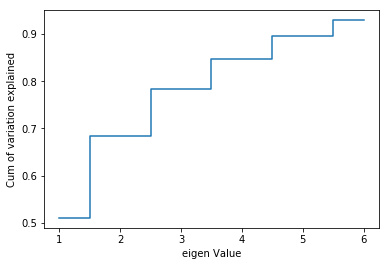

In [110]:
plt.step(list(range(1,7)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

# Dimensionality Reduction

## With 6 variables we can explain over 95% of the variation in the original data!

In [111]:
pca6 = PCA(n_components=6)
pca6.fit(XScaled)
print(pca6.components_)
print(pca6.explained_variance_ratio_)
Xpca6 = pca6.transform(XScaled)

[[ 0.26849996  0.29308589  0.29879564  0.26031651  0.07875849  0.10057391
   0.31255029 -0.30661666  0.31020467  0.28064292  0.30520392  0.31034483
   0.27087307 -0.01408497  0.03920698  0.06050164  0.01720291  0.06647567
   0.17032768]
 [-0.13524147  0.10628152 -0.08822882 -0.19006334 -0.10235996  0.04090798
   0.0140649   0.04848106  0.02870923  0.09680426  0.0297235   0.01871278
   0.17574293  0.46791435 -0.04567121 -0.11212327 -0.52098595 -0.51039693
   0.32242688]
 [-0.11417538 -0.03900468 -0.05477785  0.28277388  0.64594229  0.58719932
  -0.1005053   0.05840015 -0.11389055 -0.02613633  0.05728651 -0.11132076
  -0.04096886  0.26873077 -0.10792004 -0.07813579  0.03871057  0.06459644
   0.016689  ]
 [ 0.08480256  0.18443532 -0.06703463 -0.04706681  0.02519436  0.03916329
  -0.09915963  0.09262315 -0.09545698  0.18910081 -0.12589102 -0.09580102
   0.1955307  -0.08178988  0.62041065 -0.64303938  0.10921239  0.06477144
   0.04638903]
 [ 0.08072328 -0.10028771  0.04987312 -0.05533801 -0

In [112]:
Xpca6

array([[ 0.09351153, -0.62165023,  0.93872442,  0.12658313, -0.24459287,
         0.30265911],
       [-1.66397567, -0.44911866, -0.36135247,  0.25805641,  0.67110862,
        -0.22869458],
       [ 3.9282632 ,  0.32306883,  0.0662647 ,  1.24068562,  0.67638347,
         0.55192847],
       ...,
       [ 4.95532219,  0.05679219,  0.4905512 ,  0.30051192, -1.2225025 ,
        -0.70943762],
       [-3.34727012, -0.90560845, -0.32903649, -1.89484031,  0.24838915,
        -0.54829093],
       [-4.6309018 ,  0.74611359, -0.56619366, -1.17327992,  0.25796514,
        -0.86405882]])

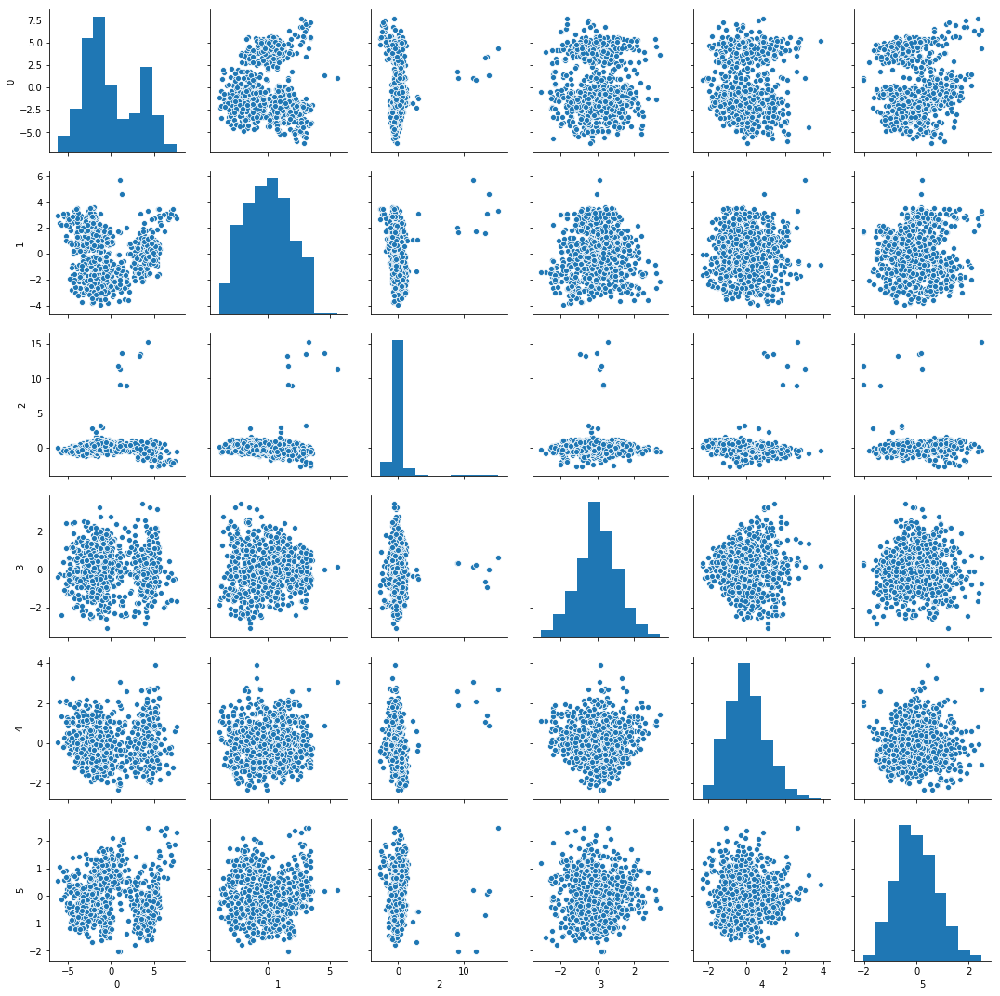

In [113]:
sns.pairplot(pd.DataFrame(Xpca6))

## 3.3.a -- Accuracy of SVM model with PCA 

In [114]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

clf = SVC()
clf.fit(Xpca6, y)
print ('score', clf.score(Xpca6, y))


score 0.9446494464944649


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


## 3.3.b -- Accuracy of SVM model without PCA 

In [115]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

clf = SVC()
clf.fit(XScaled, y)
print ('score', clf.score(XScaled, y))


score 0.984009840098401


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


# Conclusion:
## 1.If we use above PCA technique mentioned in 3.3 then the accuracy of SVM model without PCA is better than with PCA.
## 2.As we can see if we do dimensionallity reduction then the accuracy of SVM model gets reduced by almost 5% which not a big deal .
## 3.We can with both the models.

# 4. Use Support vector machines to classify the class(y) of vehicles and find the difference of accuracy with and without PCA on predictors(X). 20 points

In [116]:
X = my_data.iloc[:,0:18].values
y = my_data.iloc[:,18].values
from sklearn.preprocessing import StandardScaler


In [117]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 10)

In [118]:
X_train_sd = StandardScaler().fit_transform(X_train)
X_test_sd = StandardScaler().fit_transform(X_test)

In [119]:
cov_matrix = np.cov(X_train_sd.T)
print('Covariance Matrix \n%s', cov_matrix)

e_vals, e_vecs = np.linalg.eig(cov_matrix)

print('Eigenvectors \n%s' %e_vecs)
print('\nEigenvalues \n%s' %e_vals)

Covariance Matrix 
%s [[ 1.00154083  0.69265271  0.79068714  0.70614818  0.14703275  0.17675895
   0.81141356 -0.78672875  0.81048307  0.67859974  0.76814441  0.81717895
   0.59288604 -0.24587329  0.2331064   0.1566161   0.29895078  0.3585444 ]
 [ 0.69265271  1.00154083  0.80473489  0.63895245  0.18897602  0.27051785
   0.86183852 -0.83193301  0.85860179  0.96531692  0.81122683  0.85271926
   0.9422991   0.04695463  0.13424997 -0.01239352 -0.11637993  0.0432258 ]
 [ 0.79068714  0.80473489  1.00154083  0.7851747   0.21290146  0.29833771
   0.90704269 -0.91266146  0.89462213  0.7810356   0.86779548  0.88893252
   0.71713213 -0.22958526  0.10989015  0.26807135  0.14264479  0.33357443]
 [ 0.70614818  0.63895245  0.7851747   1.00154083  0.69173586  0.46017126
   0.7531609  -0.80356882  0.72563222  0.58662266  0.81128992  0.74073844
   0.5610937  -0.17612698  0.06504646  0.17028709  0.36117125  0.4565932 ]
 [ 0.14703275  0.18897602  0.21290146  0.69173586  1.00154083  0.64779696
   0.1525062

In [120]:
tot = sum(e_vals)
var_exp = [( i /tot ) * 100 for i in sorted(e_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 52.7380495   69.41002882  79.59478815  86.05502273  91.33101989
  94.44171172  96.33790224  97.56382452  98.42135508  98.89481253
  99.24974905  99.50299956  99.7009104   99.81209184  99.89549042
  99.96406588  99.99801103 100.        ]


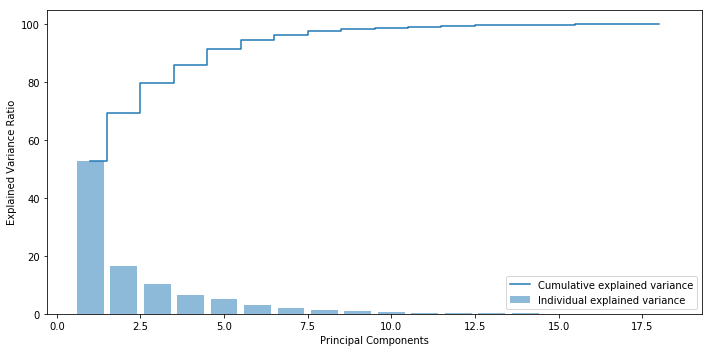

In [121]:
# Ploting 
plt.figure(figsize=(10 , 5))
plt.bar(range(1, e_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, e_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [122]:
eigen_pairs = [(np.abs(e_vals[i]), e_vecs[:,i]) for i in range(len(e_vals))]
eigen_pairs.sort(reverse=True)
eigen_pairs[:5]

[(9.507475795685,
  array([ 0.2734602 ,  0.294207  ,  0.30360812,  0.27150447,  0.09738239,
          0.10525471,  0.31532337, -0.31217475,  0.31205652,  0.28105691,
          0.30861093,  0.31245966,  0.2729198 , -0.02154414,  0.04088649,
          0.05830739,  0.02721397,  0.07293821])),
 (3.005580248019033,
  array([ 1.26863585e-01, -1.26153277e-01,  7.32826132e-02,  1.81314952e-01,
          1.30707438e-01, -2.05155738e-04, -5.12832376e-02, -1.02323798e-02,
         -6.47921552e-02, -1.08463521e-01, -6.32995688e-02, -5.54828465e-02,
         -2.01562495e-01, -4.88687476e-01,  6.53539189e-02,  1.06190120e-01,
          5.45648881e-01,  5.42361294e-01])),
 (1.8360814187772891,
  array([-0.11678397, -0.03025785, -0.05506821,  0.26283546,  0.638593  ,
          0.59655484, -0.10621648,  0.0666155 , -0.11870325, -0.00875072,
          0.04686262, -0.11921991, -0.03543782,  0.29184796, -0.09147887,
         -0.08554169, -0.00277613,  0.03509493])),
 (1.1646339692253525,
  array([-0.07293

In [123]:
w = np.hstack((eigen_pairs[0][1].reshape(18,1), 
                      eigen_pairs[1][1].reshape(18,1)))
print('Matrix W:\n', w)
X_sd_pca = X_train_sd.dot(w)

Matrix W:
 [[ 2.73460200e-01  1.26863585e-01]
 [ 2.94206998e-01 -1.26153277e-01]
 [ 3.03608117e-01  7.32826132e-02]
 [ 2.71504470e-01  1.81314952e-01]
 [ 9.73823943e-02  1.30707438e-01]
 [ 1.05254713e-01 -2.05155738e-04]
 [ 3.15323368e-01 -5.12832376e-02]
 [-3.12174746e-01 -1.02323798e-02]
 [ 3.12056516e-01 -6.47921552e-02]
 [ 2.81056914e-01 -1.08463521e-01]
 [ 3.08610931e-01 -6.32995688e-02]
 [ 3.12459664e-01 -5.54828465e-02]
 [ 2.72919799e-01 -2.01562495e-01]
 [-2.15441385e-02 -4.88687476e-01]
 [ 4.08864876e-02  6.53539189e-02]
 [ 5.83073879e-02  1.06190120e-01]
 [ 2.72139668e-02  5.45648881e-01]
 [ 7.29382123e-02  5.42361294e-01]]


In [124]:
X_train_sd.shape, w.shape, X_sd_pca.shape

((650, 18), (18, 2), (650, 2))

In [125]:
X_sd_pca

array([[-3.30756456, -0.86428685],
       [-2.55918983, -2.11467943],
       [ 6.57644371, -3.08837765],
       ...,
       [ 4.3562377 , -1.29455012],
       [ 3.2283636 , -0.46243614],
       [ 2.75980445, -0.29956148]])

## 4.a -- Accuracy of SVM model with PCA on predictors(X)

In [126]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

In [127]:
clf = SVC()
clf.fit(X_train_sd, y_train)
print ('score', clf.score(X_test_sd, y_test))


score 0.9570552147239264


## 4.b -- Accuracy of SVM model without PCA on predictors(X) 

In [128]:
from sklearn.model_selection import train_test_split

# To calculate the accuracy score of the model
from sklearn.metrics import accuracy_score, confusion_matrix

target = my_data["class"]
features=my_data
X_train, X_test, y_train, y_test = train_test_split(features,target, test_size = 0.30, random_state = 10)

In [129]:
from sklearn.svm import SVC

# Building a Support Vector Machine on train data
svc_model= SVC(kernel='linear')
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)


In [130]:
# check the accuracy on the training set
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

1.0
0.9959016393442623


In [131]:
# The accuracy score of .954 looks impressive but do not forget, it is unreliable as it is a score at
# model level. Let us look at class level, especially the class 1.

# summarize the fit of the model
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        62
           1       1.00      1.00      1.00       128
           2       1.00      0.98      0.99        54

   micro avg       1.00      1.00      1.00       244
   macro avg       0.99      0.99      0.99       244
weighted avg       1.00      1.00      1.00       244



In [132]:
#Store the accuracy results for each kernel in a dataframe for final comparison
resultsDf = pd.DataFrame({'Kernel':['Linear'], 'Accuracy': svc_model.score(X_train, y_train)})
resultsDf = resultsDf[['Kernel', 'Accuracy']]
resultsDf

,Kernel,Accuracy
0,Linear,1.0


In [133]:
# Building a Support Vector Machine on train data
svc_model = SVC(kernel='rbf')
svc_model.fit(X_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [134]:
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

1.0
0.5286885245901639


In [135]:
#Store the accuracy results for each kernel in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Kernel':['RBF'], 'Accuracy': svc_model.score(X_train, y_train)})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Kernel', 'Accuracy']]
resultsDf

,Kernel,Accuracy
0,Linear,1.0
0,RBF,1.0


In [136]:
#Building a Support Vector Machine on train data(changing the kernel)
svc_model  = SVC(kernel='poly')
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

1.0
0.9795081967213115


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [137]:
#Store the accuracy results for each kernel in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Kernel':['Poly'], 'Accuracy': svc_model.score(X_train, y_train)})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Kernel', 'Accuracy']]
resultsDf

,Kernel,Accuracy
0,Linear,1.0
0,RBF,1.0
0,Poly,1.0


In [138]:
svc_model = SVC(kernel='sigmoid')
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

##print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

0.5245901639344263


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [139]:
#Store the accuracy results for each kernel in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Kernel':['Sigmoid'], 'Accuracy': svc_model.score(X_train, y_train)})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Kernel', 'Accuracy']]
resultsDf

,Kernel,Accuracy
0,Linear,1.000000
0,RBF,1.000000
0,Poly,1.000000
0,Sigmoid,0.500879


# Conclusion:
## 1.If we use above PCA technique mentioned above then the accuracy of SVM model without PCA is better than with PCA.
## 2.As we can see if we do Dimensionality Reduction using PCA then the accuracy of SVM model gets reduced by almost 5% which is not a big deal I think.
## 3.We can use both the models excluding rbf and Sigmoid Kernels as both don't give a good recall score.

# 5.Hierarchial Clustering

### Standardize the data

Since the dimensions of the data are not really known to us, it would be wise to standardize the data using z scores before we go for any clustering methods. You can use zscore function to do this

In [140]:
interest_df = my_data.drop('class', axis=1)

from scipy.stats import zscore
interest_df_z = interest_df.apply(zscore)

interest_df_z.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,GROUP
0,0.163231,0.520408,0.060669,0.264970,1.283254,0.299721,-0.198517,0.129648,-0.217151,0.766312,-0.397397,-0.339014,0.301676,-0.321192,-0.071523,0.371287,-0.321809,0.171837,-1.481512
1,-0.322874,-0.619123,0.124067,-0.836393,-0.599253,0.085785,-0.591720,0.514333,-0.606014,-0.337462,-0.590034,-0.618754,-0.502972,-0.053505,0.538425,0.147109,0.003400,0.442318,-0.605535
2,1.256966,0.845988,1.518823,1.187734,0.530251,0.299721,1.162569,-1.152637,0.949438,0.697326,1.111591,1.122486,1.415804,0.080339,1.555006,-0.413338,-0.159204,0.036596,1.146421
3,-0.079822,-0.619123,-0.002729,-0.300595,0.153750,0.085785,-0.742952,0.642562,-0.606014,-0.337462,-0.911095,-0.738643,-1.462359,-1.258099,-0.071523,-0.301249,1.629444,1.524243,-0.605535
4,-1.052030,-0.130753,-0.763506,1.068668,5.173770,9.285029,-0.591720,0.514333,-0.606014,-0.268476,1.689501,-0.647299,0.425468,7.307905,0.538425,-0.189159,-1.460039,-1.721531,2.022399


In [141]:
from sklearn.preprocessing import StandardScaler
import numpy as np
sc = StandardScaler()
X_std = sc.fit_transform(interest_df) 

X_std[:2]

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int32, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int32, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


array([[ 0.16323063,  0.52040788,  0.06066872,  0.26497017,  1.2832543 ,
         0.2997208 , -0.19851729,  0.12964799, -0.21715097,  0.76631152,
        -0.39739727, -0.33901388,  0.30167634, -0.32119222, -0.07152328,
         0.37128716, -0.3218087 ,  0.17183708, -1.48151245],
       [-0.32287376, -0.61912319,  0.12406675, -0.83639333, -0.59925336,
         0.08578488, -0.59171992,  0.51433345, -0.60601383, -0.33746218,
        -0.59003405, -0.61875406, -0.50297155, -0.0535046 ,  0.53842522,
         0.14710858,  0.00340009,  0.44231829, -0.60553454]])

### Create datasets using multivariate normal distribution to visually observe how the clusters are formed at the end

In [142]:
np.random.seed(101)  # for repeatability of this dataset
S = np.random.multivariate_normal([10, 0], [[3, 1], [1, 4]], size=[100,])
V = np.random.multivariate_normal([0, 20], [[3, 1], [1, 4]], size=[50,])
M = np.random.multivariate_normal([10, 20], [[3, 1], [1, 4]], size=[100,])

In [143]:
X = np.concatenate((S, V, M), axis=0)
print(X.shape)  # 250 samples with 2 dimensions

(250, 2)


### Use scatter matrix to print all the 3 distributions 

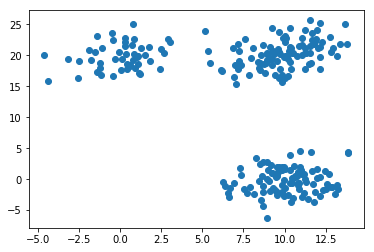

In [144]:
plt.scatter(X[:,0], X[:,1])
plt.show()

### Use ward as linkage metric and distance as Eucledian 

In [145]:
from scipy.cluster.hierarchy import dendrogram, linkage
Z = linkage(X, 'ward', metric='euclidean')
Z.shape

(249, 4)

In [146]:
Z[:]

array([[6.00000000e+00, 3.50000000e+01, 4.03105214e-02, 2.00000000e+00],
       [1.59000000e+02, 2.47000000e+02, 4.15336058e-02, 2.00000000e+00],
       [1.90000000e+02, 2.14000000e+02, 4.23431904e-02, 2.00000000e+00],
       [1.50000000e+01, 5.50000000e+01, 5.03965285e-02, 2.00000000e+00],
       [2.30000000e+01, 9.70000000e+01, 5.98615830e-02, 2.00000000e+00],
       [1.83000000e+02, 2.30000000e+02, 7.14307127e-02, 2.00000000e+00],
       [1.60000000e+02, 1.84000000e+02, 8.10640748e-02, 2.00000000e+00],
       [5.20000000e+01, 9.80000000e+01, 8.63310058e-02, 2.00000000e+00],
       [1.75000000e+02, 2.33000000e+02, 9.07935743e-02, 2.00000000e+00],
       [8.00000000e+00, 1.90000000e+01, 1.05398862e-01, 2.00000000e+00],
       [6.60000000e+01, 7.30000000e+01, 1.08977001e-01, 2.00000000e+00],
       [5.90000000e+01, 9.60000000e+01, 1.15828291e-01, 2.00000000e+00],
       [9.20000000e+01, 2.53000000e+02, 1.34937651e-01, 3.00000000e+00],
       [2.10000000e+02, 2.31000000e+02, 1.37055098e

### Plot the dendrogram for the consolidated dataframe 

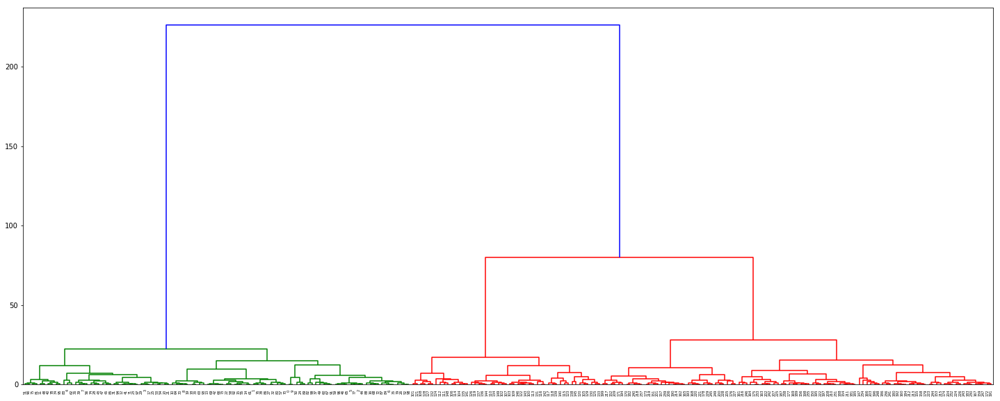

In [147]:
plt.figure(figsize=(25, 10))
dendrogram(Z)
plt.show()

### Recreate the dendrogram for last 12 merged clusters 

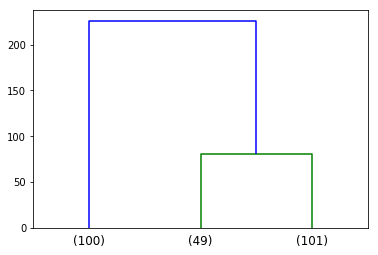

In [148]:
dendrogram(Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=3,)  # show only the last p merged clusters
plt.show()

In [149]:
max_d = 50
from scipy.cluster.hierarchy import fcluster
clusters = fcluster(Z, max_d, criterion='distance')
clusters

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3], dtype=int32)

### matplotlib to visually observe the clusters in 2D space 

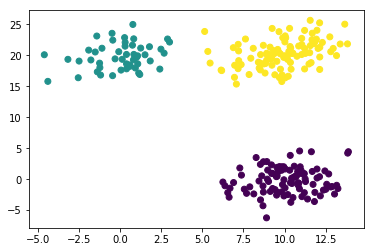

In [150]:
plt.scatter(X[:,0], X[:,1], c=clusters)  # plot points with cluster dependent colors
plt.show()